# План

* [x] анализ файла аннотаций
* [x] построение перспективы (определение, какие пиксели принадлежат какой дальности, учёт перспективы или построение сетки перспективы, по которой можно провести ограничительные линии)
* [x] простое вычитание фона
* [ ] вычитание фона на основе SIFT/SURF (кластер новых + отсутствующих точек = новый объект)
* [x] предобученная нейронка
* [x] упаковка результата в корректный формат COCO.json
* [ ] дообучение весов по датасету от EVRAZ
* [ ] отсечение боксов по линии перспективы (границе защитной области)
* [ ] предварительная обработка изображения (автоконтраст, резкость)
* [x] разбиение изображения на крупные фрагменты, чтобы различать дальние фигуры (или хотя бы отдельная матрица для дальнего плана)
* [ ] определение блоба в районе головы (каска)

# [+] Анализ и отрисовка аннотаций

In [1]:
import json
jsonfile = open("../../data_task2/train/annotations/COCO_json/coco_annotations_train.json", "r")
jsonannotation = json.load(jsonfile)
jsonfile.close()
print("keys=", jsonannotation.keys())
print("len([images])=", len(jsonannotation["images"]))
print("len([annotations])=", len(jsonannotation["annotations"]))

keys= dict_keys(['licenses', 'info', 'categories', 'images', 'annotations'])
len([images])= 500
len([annotations])= 915


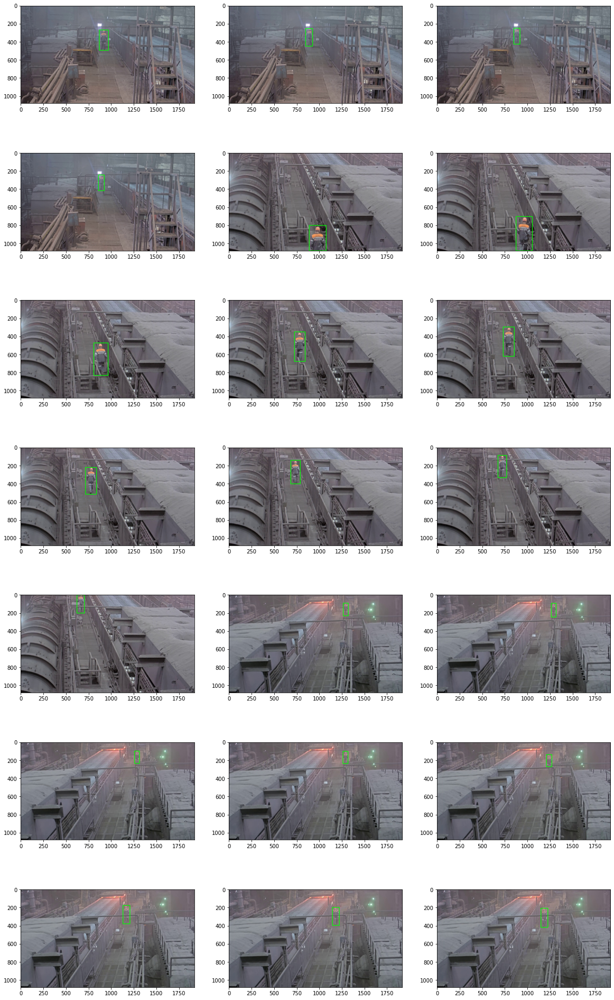

In [4]:
import math
import cv2
import matplotlib
from matplotlib import pyplot as plt
root_sample = "../../data_task2/train/images/"
sample_files = [
    "am3_1_frame035.jpg",
    "am3_1_frame037.jpg",
    "am3_1_frame040.jpg",
    "am3_1_frame042.jpg",
    "am3_3_frame017.jpg",
    "am3_3_frame018.jpg",
    "am3_3_frame021.jpg",
    "am3_3_frame023.jpg",
    "am3_3_frame024.jpg",
    "am3_3_frame026.jpg",
    "am3_3_frame028.jpg",
    "am3_3_frame030.jpg",
    "am3_3_frame034.jpg",
    "am3_4_frame040.jpg",
    "am3_4_frame046.jpg",
    "am3_4_frame048.jpg",
    "am3_4_frame049.jpg",
    "am3_4_frame053.jpg",
    "am3_4_frame056.jpg",
    "am3_4_frame057.jpg",
    "am3_4_frame058.jpg",]

n_of_file_samples = len(sample_files)
ncols = 3
fig, axarr = plt.subplots(nrows = math.ceil(n_of_file_samples / ncols), ncols = ncols, figsize = (20, 5 * (math.ceil(n_of_file_samples / ncols))))
for i in range(n_of_file_samples):
    frame = cv2.cvtColor(cv2.imread(root_sample + sample_files[i]), cv2.COLOR_BGR2RGB)
    image_ids = [itm['id'] for itm in jsonannotation['images'] if itm['file_name']==sample_files[i]]
    if image_ids is None:
        raise "Не найден id изображения с названием " + sample_files[i]
    elif len(image_ids)<1:
        raise "Не найден id изображения с названием " + sample_files[i]
    elif len(image_ids)>1:
        raise "В 'annotations' найдено более одного id для изображения с названием " + sample_files[i]
    image_id = image_ids[0]
    annotations = [itm for itm in jsonannotation['annotations'] if itm['image_id']==image_id]
    if annotations is None:
        print("Не найдены аннотации для изображения с id")
    elif len(annotations)<1:
        print("Не найдены аннотации для изображения с id")
    for annotation in annotations:
        # print(annotation["bbox"])
        x = int(annotation["bbox"][0])
        y = int(annotation["bbox"][1])
        w = int(annotation["bbox"][2])
        h = int(annotation["bbox"][3])
        cv2.rectangle(frame, (x, y), (x + w, y + h), (0, 255, 0), 5)
    
    axarr[i // ncols, i % ncols].imshow(frame)

plt.show()

# [+] Определение координат в 3D и сетка перспективы без ручной разметки

In [5]:
# положение точки перспективы x0=813, y0=116, k3 = (1080 - y0)/(1430 - x0)
from math import atan2
theta_deg = -30
phi_deg = 10
h_cam = 3.0 # высота камеры над полом

centerX = 1920 / 2
centerY = 1080 / 2

k1 = (centerX - 813)/phi_deg
k2 = abs(centerY - 116)/abs(theta_deg)
k3 = 0.52 * h_cam # наклон линии перспективы пола в кадре

x0 = centerX - phi_deg*k1
y0 = centerY + theta_deg*k2

print(k1)
print(k2)
print("k3 = ", k3, (1080 - y0)/(1430 - x0))

print(x)
print(y)

14.7
14.133333333333333
k3 =  1.56 1.5623987034035656
1148
207


# [+] Простое вычитание фона

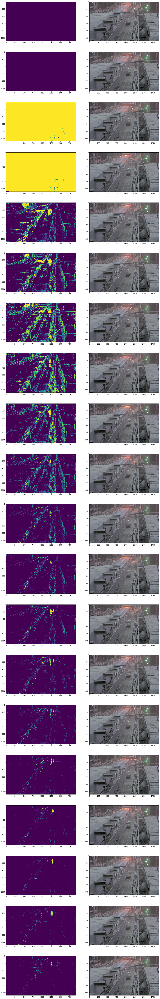

In [6]:
import cv2
import matplotlib
from matplotlib import pyplot as plt
# backgroundSubtractor = cv2.bgsegm.createBackgroundSubtractorMOG()
# backgroundSubtractor = cv2.bgsegm.createBackgroundSubtractorGMG() # не работает, возможно нужны настройки
# backgroundSubtractor = cv2.createBackgroundSubtractorMOG2(detectShadows=False)
backgroundSubtractor = cv2.createBackgroundSubtractorKNN(detectShadows=False, history = 2)


files = [
    "oz7_frame019.jpg",
    "oz7_frame022.jpg",
    "oz7_frame027.jpg",
    "oz7_frame030.jpg",
    "oz7_frame032.jpg",
    "oz7_frame041.jpg",
    "oz7_frame053.jpg",
    "oz7_frame063.jpg",
    "oz7_frame064.jpg",
    "oz7_frame068.jpg",
    "oz7_frame078.jpg",
    "oz7_frame080.jpg",
    "oz7_frame092.jpg",
    "oz7_frame369.jpg",
    "oz7_frame380.jpg",
    "oz7_frame381.jpg",
    "oz7_frame382.jpg",
    "oz7_frame385.jpg",
    "oz7_frame400.jpg",
    "oz7_frame401.jpg",
    "oz7_frame434.jpg",
    "oz7_frame447.jpg",
    "oz7_frame465.jpg",
    "oz7_frame469.jpg",
    "oz7_frame484.jpg",
    "oz7_frame494.jpg",
    "oz7_frame495.jpg",
    "oz7_frame497.jpg",
    "oz7_frame512.jpg",
    "oz7_frame514.jpg",
    "oz7_frame531.jpg",
    "oz7_frame556.jpg",
    "oz7_frame557.jpg",
    "oz7_frame558.jpg" ]

final_frame = 20
fig, axarr = plt.subplots(nrows = final_frame, ncols = 2, figsize = (18, 6 * final_frame))
for i in range(final_frame):
    frame = cv2.cvtColor(cv2.imread("../../data_task2/test/images/" + files[i]), cv2.COLOR_BGR2RGB)
    fgmask = backgroundSubtractor.apply(frame)
    axarr[i, 0].imshow(fgmask)
    axarr[i, 1].imshow(frame)

# plt.figure()
# gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

plt.show()


# Вычитание фона на основе SIFT/SURF

# [+] Обнаружение персон с OpenCV HOG+SVN

https://www.pyimagesearch.com/2015/11/09/pedestrian-detection-opencv/

https://www.geeksforgeeks.org/pedestrian-detection-using-opencv-python/

  0%|          | 0/6 [00:00<?, ?it/s]

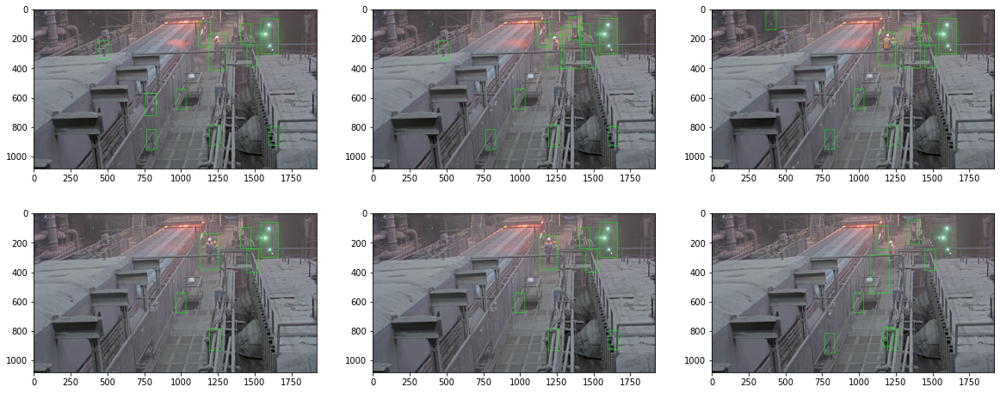

In [7]:
from imutils.object_detection import non_max_suppression
from imutils import paths
import numpy as np
import argparse
import imutils
import cv2
import math
from tqdm.notebook import tqdm

hog_descriptor = cv2.HOGDescriptor()
hog_descriptor.setSVMDetector(cv2.HOGDescriptor_getDefaultPeopleDetector())

final_frame = 6
fig, axarr = plt.subplots(nrows = math.ceil(final_frame / 3) , ncols = 3, figsize = (20, 4 * math.ceil(final_frame / 3)))
# print(axarr)
for i in tqdm(range(final_frame)):
    frame = cv2.cvtColor(cv2.imread("../../data_task2/test/images/" + files[i]), cv2.COLOR_BGR2RGB)
    (rects, weights) = hog_descriptor.detectMultiScale(frame, winStride=(4, 4), padding=(4, 4), scale=1.05)
    frame = imutils.resize(frame,
                       width=min(1920, frame.shape[1]))
    # draw the original bounding boxes
    # for (x, y, w, h) in rects:
    #     cv2.rectangle(orig, (x, y), (x + w, y + h), (0, 0, 255), 2)
        
    # apply non-maxima suppression to the bounding boxes using a
    # fairly large overlap threshold to try to maintain overlapping
    # boxes that are still people
    rects = np.array([[x, y, x + w, y + h] for (x, y, w, h) in rects])
    pick = non_max_suppression(rects, probs=None, overlapThresh=0.65)
    
    # draw the final bounding boxes
    for (xA, yA, xB, yB) in pick:
        cv2.rectangle(frame, (xA, yA), (xB, yB), (0, 255, 0), 2)
    
    # axarr[i, 0].imshow(fgmask)
    # print("row = ", i // 3, "col = ", i % 3)
    axarr[i // 3, i % 3].imshow(frame)

# plt.figure()
# gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

plt.show()

# [-] Предобученная открытая CNN (неудачная попытка 1 подключить darknet в jupyter)

https://machinelearningmastery.com/how-to-perform-object-detection-with-yolov3-in-keras/

Python + Keras + Jupyter https://towardsdatascience.com/darkeras-execute-yolov3-yolov4-object-detection-on-keras-with-darknet-pre-trained-weights-5e8428b959e2, https://github.com/AlexeyAB/darknet

https://www.analyticsvidhya.com/blog/2018/07/top-10-pretrained-models-get-started-deep-learning-part-1-computer-vision/

https://towardsdatascience.com/detecting-objects-in-urban-scenes-using-yolov5-568bd0a63c7

!!! https://colab.research.google.com/drive/1xdjyBiY75MAVRSjgmiqI7pbRLn58VrbE?usp=sharing#scrollTo=JhrQqPc2HR27



In [77]:
# import darknet functions to perform object detections
# import dependencies
from IPython.display import display, Javascript, Image
# from google.colab.output import eval_js
# from google.colab.patches import cv2_imshow
from base64 import b64decode, b64encode
import cv2
import numpy as np
import PIL
import io
import html
import time
import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
from darknet import *
# load in our YOLOv4 architecture network
network, class_names, class_colors = load_network("cfg/yolov4-csp.cfg", "cfg/coco.data", "yolov4-csp.weights")
width = network_width(network)
height = network_height(network)

# darknet helper function to run detection on image
def darknet_helper(img, width, height):
    darknet_image = make_image(width, height, 3)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_resized = cv2.resize(img_rgb, (width, height),
                              interpolation=cv2.INTER_LINEAR)

    # get image ratios to convert bounding boxes to proper size
    img_height, img_width, _ = img.shape
    width_ratio = img_width/width
    height_ratio = img_height/height

    # run model on darknet style image to get detections
    copy_image_from_bytes(darknet_image, img_resized.tobytes())
    detections = detect_image(network, class_names, darknet_image)
    free_image(darknet_image)
    return detections, width_ratio, height_ratio

# [+] Предобученная открытая CNN (удачная попытка 2 подключить darknet в jupyter - на основе репозитория https://github.com/tranleanh/darkeras-yolov4)

## Инициализация модели

In [8]:
import cv2
import numpy as np
import core_yolov4.utils as utils
import core_yolov4.common as common
import tensorflow as tf
from PIL import Image
import matplotlib.pyplot as plt
import colorsys
import random

In [9]:
def cspdarknet53(input_data):
    """
    Интеграция из https://github.com/tranleanh/darkeras-yolov4
    """
    input_data = common.convolutional(input_data, (3, 3,  3,  32), activate_type="mish")
    input_data = common.convolutional(input_data, (3, 3, 32,  64), downsample=True, activate_type="mish")

    route = input_data
    route = common.convolutional(route, (1, 1, 64, 64), activate_type="mish")
    input_data = common.convolutional(input_data, (1, 1, 64, 64), activate_type="mish")
    for i in range(1):
        input_data = common.residual_block(input_data,  64,  32, 64, activate_type="mish")
    input_data = common.convolutional(input_data, (1, 1, 64, 64), activate_type="mish")

    input_data = tf.concat([input_data, route], axis=-1)
    input_data = common.convolutional(input_data, (1, 1, 128, 64), activate_type="mish")
    input_data = common.convolutional(input_data, (3, 3, 64, 128), downsample=True, activate_type="mish")
    route = input_data
    route = common.convolutional(route, (1, 1, 128, 64), activate_type="mish")
    input_data = common.convolutional(input_data, (1, 1, 128, 64), activate_type="mish")
    for i in range(2):
        input_data = common.residual_block(input_data, 64,  64, 64, activate_type="mish")
    input_data = common.convolutional(input_data, (1, 1, 64, 64), activate_type="mish")
    input_data = tf.concat([input_data, route], axis=-1)

    input_data = common.convolutional(input_data, (1, 1, 128, 128), activate_type="mish")
    input_data = common.convolutional(input_data, (3, 3, 128, 256), downsample=True, activate_type="mish")
    route = input_data
    route = common.convolutional(route, (1, 1, 256, 128), activate_type="mish")
    input_data = common.convolutional(input_data, (1, 1, 256, 128), activate_type="mish")
    for i in range(8):
        input_data = common.residual_block(input_data, 128, 128, 128, activate_type="mish")
    input_data = common.convolutional(input_data, (1, 1, 128, 128), activate_type="mish")
    input_data = tf.concat([input_data, route], axis=-1)

    input_data = common.convolutional(input_data, (1, 1, 256, 256), activate_type="mish")
    route_1 = input_data
    input_data = common.convolutional(input_data, (3, 3, 256, 512), downsample=True, activate_type="mish")
    route = input_data
    route = common.convolutional(route, (1, 1, 512, 256), activate_type="mish")
    input_data = common.convolutional(input_data, (1, 1, 512, 256), activate_type="mish")
    for i in range(8):
        input_data = common.residual_block(input_data, 256, 256, 256, activate_type="mish")
    input_data = common.convolutional(input_data, (1, 1, 256, 256), activate_type="mish")
    input_data = tf.concat([input_data, route], axis=-1)

    input_data = common.convolutional(input_data, (1, 1, 512, 512), activate_type="mish")
    route_2 = input_data
    input_data = common.convolutional(input_data, (3, 3, 512, 1024), downsample=True, activate_type="mish")
    route = input_data
    route = common.convolutional(route, (1, 1, 1024, 512), activate_type="mish")
    input_data = common.convolutional(input_data, (1, 1, 1024, 512), activate_type="mish")
    for i in range(4):
        input_data = common.residual_block(input_data, 512, 512, 512, activate_type="mish")
    input_data = common.convolutional(input_data, (1, 1, 512, 512), activate_type="mish")
    input_data = tf.concat([input_data, route], axis=-1)

    input_data = common.convolutional(input_data, (1, 1, 1024, 1024), activate_type="mish")
    input_data = common.convolutional(input_data, (1, 1, 1024, 512))
    input_data = common.convolutional(input_data, (3, 3, 512, 1024))
    input_data = common.convolutional(input_data, (1, 1, 1024, 512))

    input_data = tf.concat([tf.nn.max_pool(input_data, ksize=13, padding='SAME', strides=1), tf.nn.max_pool(input_data, ksize=9, padding='SAME', strides=1)
                            , tf.nn.max_pool(input_data, ksize=5, padding='SAME', strides=1), input_data], axis=-1)
    input_data = common.convolutional(input_data, (1, 1, 2048, 512))
    input_data = common.convolutional(input_data, (3, 3, 512, 1024))
    input_data = common.convolutional(input_data, (1, 1, 1024, 512))

    return route_1, route_2, input_data

In [10]:
def YOLOv4(input_layer):
    """
    Интеграция из https://github.com/tranleanh/darkeras-yolov4
    """
    NUM_CLASS = 80
    
    route_1, route_2, conv = cspdarknet53(input_layer)

    route = conv
    conv = common.convolutional(conv, (1, 1, 512, 256))
    conv = common.upsample(conv)
    route_2 = common.convolutional(route_2, (1, 1, 512, 256))
    conv = tf.concat([route_2, conv], axis=-1)

    conv = common.convolutional(conv, (1, 1, 512, 256))
    conv = common.convolutional(conv, (3, 3, 256, 512))
    conv = common.convolutional(conv, (1, 1, 512, 256))
    conv = common.convolutional(conv, (3, 3, 256, 512))
    conv = common.convolutional(conv, (1, 1, 512, 256))

    route_2 = conv
    conv = common.convolutional(conv, (1, 1, 256, 128))
    conv = common.upsample(conv)
    route_1 = common.convolutional(route_1, (1, 1, 256, 128))
    conv = tf.concat([route_1, conv], axis=-1)

    conv = common.convolutional(conv, (1, 1, 256, 128))
    conv = common.convolutional(conv, (3, 3, 128, 256))
    conv = common.convolutional(conv, (1, 1, 256, 128))
    conv = common.convolutional(conv, (3, 3, 128, 256))
    conv = common.convolutional(conv, (1, 1, 256, 128))

    route_1 = conv
    conv = common.convolutional(conv, (3, 3, 128, 256))
    conv_sbbox = common.convolutional(conv, (1, 1, 256, 3 * (NUM_CLASS + 5)), activate=False, bn=False)

    conv = common.convolutional(route_1, (3, 3, 128, 256), downsample=True)
    conv = tf.concat([conv, route_2], axis=-1)

    conv = common.convolutional(conv, (1, 1, 512, 256))
    conv = common.convolutional(conv, (3, 3, 256, 512))
    conv = common.convolutional(conv, (1, 1, 512, 256))
    conv = common.convolutional(conv, (3, 3, 256, 512))
    conv = common.convolutional(conv, (1, 1, 512, 256))

    route_2 = conv
    conv = common.convolutional(conv, (3, 3, 256, 512))
    conv_mbbox = common.convolutional(conv, (1, 1, 512, 3 * (NUM_CLASS + 5)), activate=False, bn=False)

    conv = common.convolutional(route_2, (3, 3, 256, 512), downsample=True)
    conv = tf.concat([conv, route], axis=-1)

    conv = common.convolutional(conv, (1, 1, 1024, 512))
    conv = common.convolutional(conv, (3, 3, 512, 1024))
    conv = common.convolutional(conv, (1, 1, 1024, 512))
    conv = common.convolutional(conv, (3, 3, 512, 1024))
    conv = common.convolutional(conv, (1, 1, 1024, 512))

    conv = common.convolutional(conv, (3, 3, 512, 1024))
    conv_lbbox = common.convolutional(conv, (1, 1, 1024, 3 * (NUM_CLASS + 5)), activate=False, bn=False)

    return [conv_sbbox, conv_mbbox, conv_lbbox]

In [11]:
def decode(conv_output, i=0):
    """
    Интеграция из https://github.com/tranleanh/darkeras-yolov4
    """
    NUM_CLASS = 80
    STRIDES = np.array([8, 16, 32])
    
    anchors = np.array([12, 16, 19, 36, 40, 28, 36, 75, 76, 55, 72, 146, 142, 110, 192, 243, 459, 401])
    
    ANCHORS = anchors.reshape(3, 3, 2)
    
    XYSCALE=[1.05, 1.05, 1.05]
    
    conv_shape = tf.shape(conv_output)
    batch_size = conv_shape[0]
    output_size = conv_shape[1]
    
    conv_output = tf.reshape(conv_output,
                             (batch_size, output_size, output_size, 3, 5 + NUM_CLASS))

    conv_raw_dxdy, conv_raw_dwdh, conv_raw_conf, conv_raw_prob = tf.split(conv_output, (2, 2, 1, NUM_CLASS), axis=-1)

    xy_grid = tf.meshgrid(tf.range(output_size), tf.range(output_size))
    xy_grid = tf.expand_dims(tf.stack(xy_grid, axis=-1), axis=2)  # [gx, gy, 1, 2]
    xy_grid = tf.tile(tf.expand_dims(xy_grid, axis=0), [batch_size, 1, 1, 3, 1])

    xy_grid = tf.cast(xy_grid, tf.float32)

    pred_xy = ((tf.sigmoid(conv_raw_dxdy) * XYSCALE[i]) - 0.5 * (XYSCALE[i] - 1) + xy_grid) * STRIDES[i]
    pred_wh = (tf.exp(conv_raw_dwdh) * ANCHORS[i])
    pred_xywh = tf.concat([pred_xy, pred_wh], axis=-1)

    pred_conf = tf.sigmoid(conv_raw_conf)
    pred_prob = tf.sigmoid(conv_raw_prob)

    return tf.concat([pred_xywh, pred_conf, pred_prob], axis=-1)

In [12]:
def draw_bbox(image, bboxes, show_label=True):
    """
    Интеграция из https://github.com/tranleanh/darkeras-yolov4
    bboxes: [x_min, y_min, x_max, y_max, probability, cls_id] format coordinates.
    """
    
    classes = utils.read_class_names("./data/classes/coco.names")

    num_classes = len(classes)
    image_h, image_w, _ = image.shape
    hsv_tuples = [(1.0 * x / num_classes, 1., 1.) for x in range(num_classes)]
    colors = list(map(lambda x: colorsys.hsv_to_rgb(*x), hsv_tuples))
    colors = list(map(lambda x: (int(x[0] * 255), int(x[1] * 255), int(x[2] * 255)), colors))

    random.seed(0)
    random.shuffle(colors)
    random.seed(None)

    for i, bbox in enumerate(bboxes):
        coor = np.array(bbox[:4], dtype=np.int32)
        fontScale = 0.5
        score = bbox[4]
        class_ind = int(bbox[5])
        bbox_color = colors[class_ind]
        bbox_thick = int(0.6 * (image_h + image_w) / 600)
        c1, c2 = (coor[0], coor[1]), (coor[2], coor[3])
        cv2.rectangle(image, c1, c2, bbox_color, bbox_thick)

        if show_label:
            bbox_mess = '%s: %.2f' % (classes[class_ind], score)
            t_size = cv2.getTextSize(bbox_mess, 0, fontScale, thickness=bbox_thick//2)[0]
            cv2.rectangle(image, c1, (c1[0] + t_size[0], c1[1] - t_size[1] - 3), bbox_color, -1)  # filled

            cv2.putText(image, bbox_mess, (c1[0], c1[1]-2), cv2.FONT_HERSHEY_SIMPLEX,
                        fontScale, (0, 0, 0), bbox_thick//2, lineType=cv2.LINE_AA)

    return image

In [13]:
input_size   = 608
input_layer  = tf.keras.layers.Input([input_size, input_size, 3])
feature_maps = YOLOv4(input_layer)

feature_maps_array = np.array(feature_maps)

for fmap in feature_maps_array:
    print(fmap.shape)

(None, 76, 76, 255)
(None, 38, 38, 255)
(None, 19, 19, 255)


In [14]:
bbox_tensors = []
for i, fm in enumerate(feature_maps):
    bbox_tensor = decode(fm, i)
    bbox_tensors.append(bbox_tensor)

In [16]:
# Load Weights
model = None
model = tf.keras.Model(input_layer, bbox_tensors)

# файл весов, источник - https://github.com/AlexeyAB/darknet#how-to-evaluate-ap-of-yolov4-on-the-ms-coco-evaluation-server,
# прямая ссылка https://github.com/AlexeyAB/darknet/releases/download/darknet_yolo_v3_optimal/yolov4.weights
utils.load_weights(model, "./weights/yolov4.weights")
model.summary()

Model: "functional_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 608, 608, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 608, 608, 32) 864         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 608, 608, 32) 128         conv2d[0][0]                     
__________________________________________________________________________________________________
tf_op_layer_Softplus (TensorFlo [(None, 608, 608, 32 0           batch_normalization[0][0]        
_______________________________________________________________________________________

## Оценка файлов

Всего 150 файлов
['oz_violation_frame544.jpg', 'oz_violation_frame542.jpg', 'oz_violation_frame522.jpg', 'oz_violation_frame453.jpg', 'oz_violation_frame451.jpg', 'oz_violation_frame101.jpg', 'oz_violation_frame100.jpg', 'oz_violation_frame099.jpg', 'oz_violation_frame006.jpg', 'oz_frame617.jpg', 'oz_frame613.jpg', 'oz_frame583.jpg', 'oz_frame574.jpg', 'oz_frame564.jpg', 'oz_frame559.jpg', 'oz_frame551.jpg', 'oz_frame550.jpg', 'oz_frame549.jpg', 'oz_frame541.jpg', 'oz_frame540.jpg', 'oz_frame539.jpg', 'oz_frame536.jpg', 'oz_frame532.jpg', 'oz_frame528.jpg', 'oz_frame514.jpg', 'oz_frame506.jpg', 'oz_frame482.jpg', 'oz_frame481.jpg', 'oz_frame479.jpg', 'oz_frame472.jpg', 'oz_frame455.jpg', 'oz_frame436.jpg', 'oz_frame430.jpg', 'oz_frame421.jpg', 'oz_frame418.jpg', 'oz_frame254.jpg', 'oz_frame201.jpg', 'oz_frame199.jpg', 'oz_frame186.jpg', 'oz_frame151.jpg', 'oz_frame141.jpg', 'oz_frame140.jpg', 'oz_frame127.jpg', 'oz_frame124.jpg', 'oz_frame110.jpg', 'oz_frame102.jpg', 'oz_frame076.jpg',

In [17]:
from tqdm.notebook import tqdm
import math

import os
images_root = "../../data_task2/test/images/"
visualize_root = "../../data_task2/test/visualize/"
filenames = []

result_coco_dict = {
    "licenses": [{"name": "", "id": 0, "url": ""}], # не меняется
    "info": {"contributor": "", "date_created": "", "description": "", "url": "", "version": "", "year": ""},  # не меняется
    "images": [], # [{"id": 1, "width": 1920, "height": 1080, "file_name": "oz_violation_frame544.jpg", "license": 0, "flickr_url": "", "coco_url": "", "date_captured": 0}],
    "annotations": [], # [{"id": 1, "image_id": 1, "category_id": 1, "segmentation": [], "area": 11039.886099999992, "bbox": [952, 377, 97, 287], "iscrowd": 0, "attributes": {"occluded": false}}],
    "categories": [{"id": 1, "name": "person", "supercategory": ""}]  # не меняется
}

for r, d, f in os.walk(images_root):
    for filename in f:
        if filename.lower().endswith(".jpg") or filename.lower().endswith(".jpeg"):
            filenames.append(filename)
            
filenames.sort()
filenames.reverse()

print("Всего", len(filenames), "файлов")
print(filenames)

classes = utils.read_class_names("./data/classes/coco.names")
print(classes)

image_id = 1
annotation_id = 1
threshold = 0.2

n_of_file_samples = 6
ncols = 3
#DEBUG fig, axarr = plt.subplots(nrows = math.ceil(n_of_file_samples / ncols), ncols = ncols, figsize = (20, 5 * (math.ceil(n_of_file_samples / ncols))))
i = 0
#DEBUG for filename in tqdm(filenames[:n_of_file_samples]):

for filename in tqdm(filenames):
    
    original_image = cv2.imread(images_root + filename)
    original_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)
    original_image_size = original_image.shape[:2]
    
    # приведение формата изображения к входной размерности НС
    image_data = cv2.resize(original_image, (input_size, input_size))
    image_data = image_data/255.
    image_data = image_data[np.newaxis, ...].astype(np.float32)
    
    # отдельная матрица для ДАЛЬНЕГО ракурса
    x0_far = original_image.shape[1] // 2 - input_size // 2#original_image.shape[1] // 4
    y0_far = 0
    x1_far = original_image.shape[1] // 2 + input_size // 2# original_image.shape[1] // 4 + original_image.shape[1] // 2
    y1_far = input_size # original_image.shape[0] // 2
    far_image_size = (y1_far - y0_far, x1_far - x0_far)
    image_data_far = original_image[y0_far:y1_far, x0_far : x1_far]
    image_data_far = cv2.resize(image_data_far, (input_size, input_size))
    image_to_display = image_data_far.copy()
    image_data_far = image_data_far/255.
    image_data_far = image_data_far[np.newaxis, ...].astype(np.float32)
    
    # детектирование, на выходе - габаритные прямоугольники
    pred_bbox = model.predict(image_data)
    # print("pred_bbox = ", pred_bbox)
    # print("pred_bbox.len = ", len(pred_bbox))
    pred_bbox = [tf.reshape(x, (-1, tf.shape(x)[-1])) for x in pred_bbox]
    # print("pred_bbox = ", pred_bbox)
    # print("pred_bbox.len = ", len(pred_bbox))
    pred_bbox = tf.concat(pred_bbox, axis=0)
    # print("pred_bbox = ", pred_bbox)
    # print("pred_bbox.shape = ", pred_bbox.shape)
    
    pred_bbox_far = model.predict(image_data_far)
    pred_bbox_far = [tf.reshape(x, (-1, tf.shape(x)[-1])) for x in pred_bbox_far]
    pred_bbox_far = tf.concat(pred_bbox_far, axis=0)

    
    # смасштабировать габариты к изначальному разрешению
    pred_bbox_array = np.array(pred_bbox)
    # print("pred_bbox_array.shape = ", pred_bbox_array.shape)
    bboxes = utils.postprocess_boxes(pred_bbox, original_image_size, input_size, 0.05)
    # bboxes = utils.nms(bboxes, 0.45, method='nms')  

    # смасштабировать габариты к изначальному разрешению
    pred_bbox_array_far = np.array(pred_bbox_far)
    bboxes_far = utils.postprocess_boxes(pred_bbox_far, far_image_size, input_size, 0.05)
    # print("utils.postprocess_boxes()", bboxes_far)
    # bboxes_far = utils.nms(bboxes_far, 0.45, method='nms')
    # print("utils.nms()", bboxes_far)
    # print(bboxes_far)
    
    for j in range(len(bboxes_far)):
        bboxes_far[j][0] += x0_far
        bboxes_far[j][2] += x0_far
        if bboxes_far[j][3] != far_image_size[0]:
            np.vstack((bboxes, bboxes_far[j]))
    # print(bboxes_far)
    
    bboxes = utils.nms(bboxes, 0.45, method='nms')    
    # добавление очередного изображения в массив "images"
    image_item = {"id" : image_id, "file_name": filename, "width" : 1920, "height": 1080, "license": 0, "flickr_url": "", "coco_url": "", "date_captured": 0}
    result_coco_dict["images"].append(image_item)
    
    # добавление прямоугольников в массив "annotations", если объект - человек c вероятностью > 0.6
    bboxes_person_only = []
    image_to_preview = original_image.copy()
    for box in bboxes:
        x1, y1, x2, y2 = int(box[0]), int(box[1]), int(box[2]), int(box[3])
        coeff = box[4]
        cls_id = int(box[5])
        if (classes[cls_id]=="person") and (coeff > threshold) and (box[0] > 0) and (box[1] > 0):
            annotation_item = {"id": annotation_id, "image_id": image_id, "category_id": 1, "segmentation": [], "iscrowd": 0, "attributes": {"occluded": False}}
            x_box = box[0]
            y_box = box[1]
            w_box = box[2] - x_box
            h_box = box[3] - y_box
            x_box1 = box[2]
            y_box1 = box[3]
            if (x_box1 < 1920 //3) or (x_box > 2 * 1920 / 3):
                continue
            annotation_item["area"]=w_box*h_box
            # annotation_item["coeff"]=coeff
            annotation_item["bbox"]=[x_box, y_box, w_box, h_box]
            result_coco_dict["annotations"].append(annotation_item)
            annotation_id += 1
            bboxes_person_only.append(box)
            cv2.rectangle(image_to_preview, (int(x_box), int(y_box)), (int(x_box + w_box), int(y_box + h_box)), (0, 255, 0), 5)
    
    #DEBUG image_marked = draw_bbox(original_image, bboxes_person_only)
    cv2.imwrite(visualize_root + filename, cv2.cvtColor(image_to_preview, cv2.COLOR_BGR2RGB))
    
    #DEBUG axarr[i // ncols, i % ncols].imshow(image_to_display)
    image_id += 1
    i += 1

#DEBUG  plt.show()

Всего 150 файлов
['oz_violation_frame544.jpg', 'oz_violation_frame542.jpg', 'oz_violation_frame522.jpg', 'oz_violation_frame453.jpg', 'oz_violation_frame451.jpg', 'oz_violation_frame101.jpg', 'oz_violation_frame100.jpg', 'oz_violation_frame099.jpg', 'oz_violation_frame006.jpg', 'oz_frame617.jpg', 'oz_frame613.jpg', 'oz_frame583.jpg', 'oz_frame574.jpg', 'oz_frame564.jpg', 'oz_frame559.jpg', 'oz_frame551.jpg', 'oz_frame550.jpg', 'oz_frame549.jpg', 'oz_frame541.jpg', 'oz_frame540.jpg', 'oz_frame539.jpg', 'oz_frame536.jpg', 'oz_frame532.jpg', 'oz_frame528.jpg', 'oz_frame514.jpg', 'oz_frame506.jpg', 'oz_frame482.jpg', 'oz_frame481.jpg', 'oz_frame479.jpg', 'oz_frame472.jpg', 'oz_frame455.jpg', 'oz_frame436.jpg', 'oz_frame430.jpg', 'oz_frame421.jpg', 'oz_frame418.jpg', 'oz_frame254.jpg', 'oz_frame201.jpg', 'oz_frame199.jpg', 'oz_frame186.jpg', 'oz_frame151.jpg', 'oz_frame141.jpg', 'oz_frame140.jpg', 'oz_frame127.jpg', 'oz_frame124.jpg', 'oz_frame110.jpg', 'oz_frame102.jpg', 'oz_frame076.jpg',

  0%|          | 0/150 [00:00<?, ?it/s]

In [20]:
# for i in range(len(result_coco_dict["annotations"])):
#     print(result_coco_dict["annotations"][i])#["coeff"]

In [18]:
from datetime import datetime
import json
file_result = open("Mountain_fighters_team_" +"{:0.1}_".format(threshold) + datetime.now().strftime("%Y_%m_%d-%H_%M_%S") +".coco.json", "w")

json.dump(result_coco_dict, file_result)
file_result.close()

In [20]:
import pandas as pd
tmpjson = json.load(open("Mountain_fighters_team_0.6_2021_10_31-09_11_10.coco.json","r"))
annotations = tmpjson["annotations"]
df = pd.DataFrame(tmpjson["annotations"])
pd.set_option('display.max_rows', df.shape[0]+1)
df
# i = 0
# for annotation in annotations:
#     print(i, annotation["bbox"][0]+annotation["bbox"][1]+annotation["bbox"][2]+annotation["bbox"][3])
#     i += 1

,id,image_id,category_id,segmentation,iscrowd,attributes,area,bbox
0,1,1,1,[],0,{'occluded': False},5902.635320,"[961.92138671875, 243.546875, 53.58837890625, ..."
1,2,1,1,[],0,{'occluded': False},8818.050506,"[849.3037719726562, 271.7576904296875, 55.1165..."
2,3,1,1,[],0,{'occluded': False},9146.297208,"[844.7778778076172, 270.7529296875, 58.4192810..."
3,4,1,1,[],0,{'occluded': False},6377.320887,"[961.2415466308594, 242.520263671875, 55.33874..."
4,5,2,1,[],0,{'occluded': False},9238.635604,"[849.4088134765625, 268.5802307128906, 56.9500..."
5,6,2,1,[],0,{'occluded': False},8787.849892,"[917.4987182617188, 249.7296905517578, 54.3115..."
6,7,2,1,[],0,{'occluded': False},9267.416059,"[843.6537475585938, 270.98150634765625, 59.255..."
7,8,2,1,[],0,{'occluded': False},5393.587213,"[927.8552551269531, 243.0259552001953, 49.1288..."
8,9,3,1,[],0,{'occluded': False},16250.658076,"[880.5678100585938, 316.8050842285156, 78.4490..."
9,10,3,1,[],0,{'occluded': False},14024.610853,"[960.4380493164062, 288.383056640625, 62.60546..."


# Обнаружение каски